In [1]:
import os
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans

In [2]:
print(os.getcwd())

D:\Github\Stomach-Status-Classification\Data Preprocessing\bag_of_visual_word


In [3]:
os.chdir("..")
os.chdir("..")
print(os.getcwd())

D:\Github\Stomach-Status-Classification


In [4]:
main_data_dir = os.getcwd() + "\\Data set"
kmean_data_dir = main_data_dir + "\\kmean_dataset"
import glob

sift_kmean_data = [x for x in glob.glob(kmean_data_dir + '\\*') if 'sift' in x]
print(sift_kmean_data)

['D:\\Github\\Stomach-Status-Classification\\Data set\\kmean_dataset\\sift_train_0_3_0.04_10_1.6.csv']


In [37]:
sift_df = pd.read_csv(sift_kmean_data[0])
sift_df.head()

,Unnamed: 0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_119,feature_120,feature_121,feature_122,feature_123,feature_124,feature_125,feature_126,feature_127,feature_128
0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,...,0.0,0.0,22.0,65.0,5.0,0.0,0.0,0.0,0.0,0.0
1,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,48.0,...,0.0,0.0,7.0,150.0,50.0,0.0,0.0,0.0,0.0,0.0
2,2,56.0,1.0,0.0,0.0,0.0,0.0,0.0,6.0,203.0,...,10.0,30.0,5.0,0.0,0.0,0.0,0.0,0.0,23.0,66.0
3,3,10.0,0.0,0.0,0.0,0.0,0.0,15.0,60.0,140.0,...,0.0,0.0,1.0,111.0,95.0,2.0,0.0,0.0,0.0,0.0
4,4,0.0,0.0,0.0,0.0,0.0,5.0,75.0,16.0,0.0,...,0.0,0.0,0.0,0.0,92.0,146.0,33.0,2.0,0.0,0.0


In [38]:
sift_df.shape

(50216, 129)

In [39]:
from sklearn import metrics
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt

X = sift_df.to_numpy()
print(X.shape)

(50216, 129)


In [40]:
print(X[0, :])

[  0.   0.   0.   0.   0.   0.   0.   0.   0.   3.   0.   0.   0.   0.
   0.   0.   8.   8.   0.   0.   0.   0.   0.   0. 141.   2.   0.   0.
   0.   0.   0.   0. 141.  10.   2.   0.   0.   0.   0.   0.   0. 141.
  10.   0.   0.   0.   0.   0.  70. 102.   9.   0.   0.   0.   0.   0.
 141.   7.   2.   0.   0.   0.   0.   1.  48. 105.  12.   0.   0.   0.
   0.   0.  11. 141. 100.   0.   0.   0.   0.   0.  18. 141. 119.   0.
   0.   0.   0.   0.  13.  17.  32.   0.   0.   0.   0.   0.   2.  76.
  12.   0.   0.   0.   0.   0.  41. 141. 141.   0.   0.   0.   0.   0.
   2. 126. 138.   2.   0.   0.   0.   0.   0.  22.  65.   5.   0.   0.
   0.   0.   0.]


In [41]:
print(X[-1, :])

[5.0215e+04 1.3300e+02 3.1000e+01 0.0000e+00 0.0000e+00 0.0000e+00
 0.0000e+00 0.0000e+00 0.0000e+00 1.8700e+02 3.8000e+01 0.0000e+00
 0.0000e+00 0.0000e+00 0.0000e+00 1.1000e+01 3.1000e+01 1.2000e+01
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 1.0000e+00 5.2000e+01
 6.1000e+01 1.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 1.0000e+00
 5.0000e+00 1.9000e+01 3.0000e+01 1.2500e+02 2.9000e+01 0.0000e+00
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 1.8700e+02
 6.6000e+01 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 1.5000e+01
 4.6000e+01 6.7000e+01 1.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00
 3.3000e+01 1.2800e+02 4.9000e+01 0.0000e+00 0.0000e+00 0.0000e+00
 0.0000e+00 0.0000e+00 5.3000e+01 6.3000e+01 3.0000e+00 5.9000e+01
 8.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00
 4.0000e+00 1.8700e+02 3.5000e+01 0.0000e+00 0.0000e+00 0.0000e+00
 0.0000e+00 6.0000e+00 1.0400e+02 1.2400e+02 1.0000e+00 0.0000e+00
 0.0000e+00 4.0000e+00 9.5000e+01 6.7000e+01 7.8000e+01 0.0000

In [42]:
X = X[:, 1:]
print(X.shape)
print(X[0, :])

(50216, 128)
[  0.   0.   0.   0.   0.   0.   0.   0.   3.   0.   0.   0.   0.   0.
   0.   8.   8.   0.   0.   0.   0.   0.   0. 141.   2.   0.   0.   0.
   0.   0.   0. 141.  10.   2.   0.   0.   0.   0.   0.   0. 141.  10.
   0.   0.   0.   0.   0.  70. 102.   9.   0.   0.   0.   0.   0. 141.
   7.   2.   0.   0.   0.   0.   1.  48. 105.  12.   0.   0.   0.   0.
   0.  11. 141. 100.   0.   0.   0.   0.   0.  18. 141. 119.   0.   0.
   0.   0.   0.  13.  17.  32.   0.   0.   0.   0.   0.   2.  76.  12.
   0.   0.   0.   0.   0.  41. 141. 141.   0.   0.   0.   0.   0.   2.
 126. 138.   2.   0.   0.   0.   0.   0.  22.  65.   5.   0.   0.   0.
   0.   0.]


In [43]:
distortions = []
inertias = []
mapping1 = {}
mapping2 = {}
random_state = 42
K = range(2, 20)
  
for k in K:
    # Building and fitting the model
    kmeanModel = KMeans(n_clusters=k, random_state = random_state).fit(X)
    kmeanModel.fit(X)
  
    distortions.append(sum(np.min(cdist(X, kmeanModel.cluster_centers_,
                                        'euclidean'), axis=1)) / X.shape[0])
    inertias.append(kmeanModel.inertia_)
  
    mapping1[k] = sum(np.min(cdist(X, kmeanModel.cluster_centers_,
                                   'euclidean'), axis=1)) / X.shape[0]
    mapping2[k] = kmeanModel.inertia_

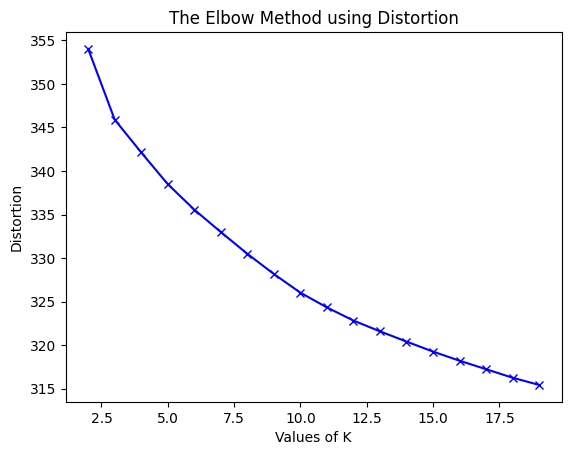

In [44]:
plt.plot(K, distortions, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Distortion')
plt.title('The Elbow Method using Distortion')
plt.show()

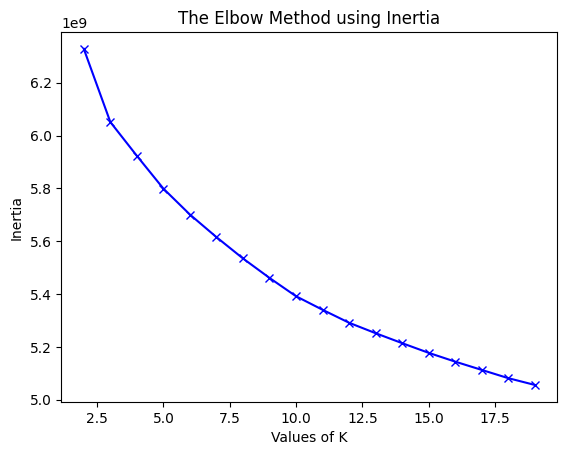

In [45]:
plt.plot(K, inertias, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Inertia')
plt.title('The Elbow Method using Inertia')
plt.show()

For n_clusters = 2 The average silhouette_score is : 0.09824034116746723
For n_clusters = 3 The average silhouette_score is : 0.08302866761281867
For n_clusters = 4 The average silhouette_score is : 0.06553897246101449
For n_clusters = 5 The average silhouette_score is : 0.051173677322191066
For n_clusters = 6 The average silhouette_score is : 0.0513820232729836
For n_clusters = 7 The average silhouette_score is : 0.05022812280204229
For n_clusters = 8 The average silhouette_score is : 0.0500771151234892
For n_clusters = 9 The average silhouette_score is : 0.04974493226247457
For n_clusters = 10 The average silhouette_score is : 0.04928125507912204
For n_clusters = 11 The average silhouette_score is : 0.04609991752763626
For n_clusters = 12 The average silhouette_score is : 0.045461359688237266
For n_clusters = 13 The average silhouette_score is : 0.04544075254990315
For n_clusters = 14 The average silhouette_score is : 0.045835950604292776
For n_clusters = 15 The average silhouette_sc

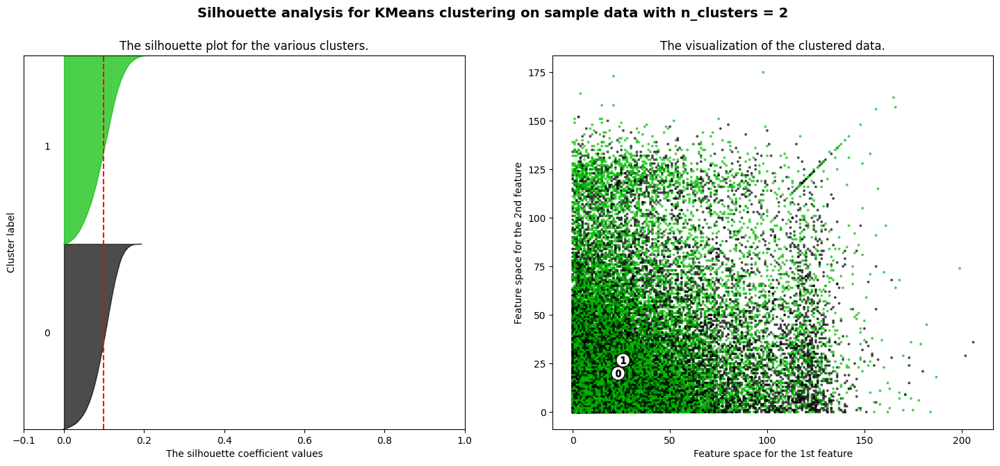

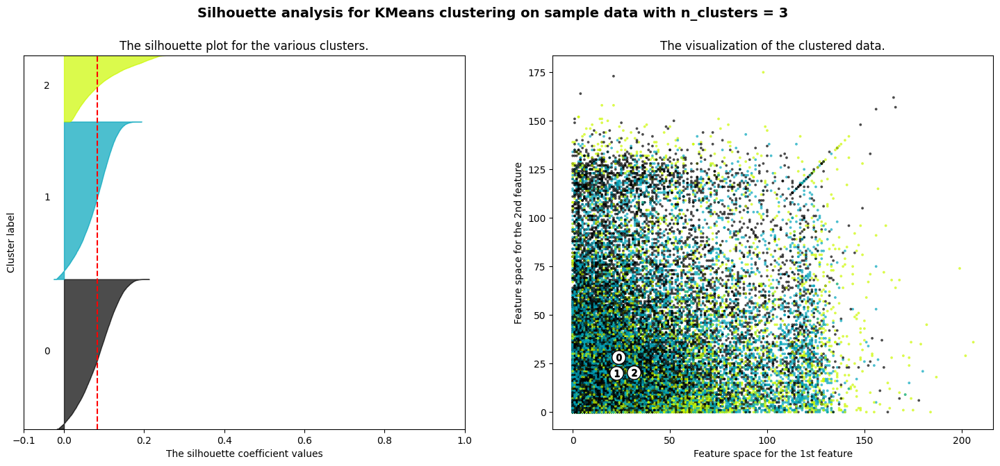

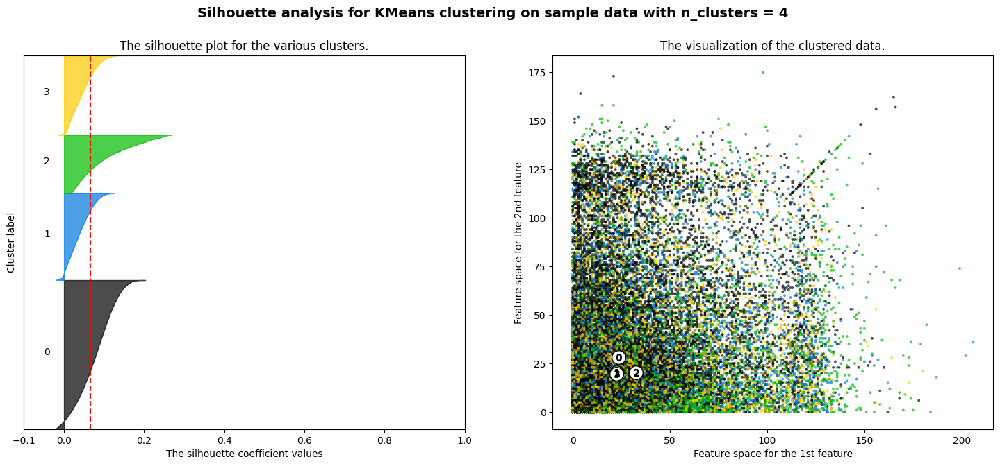

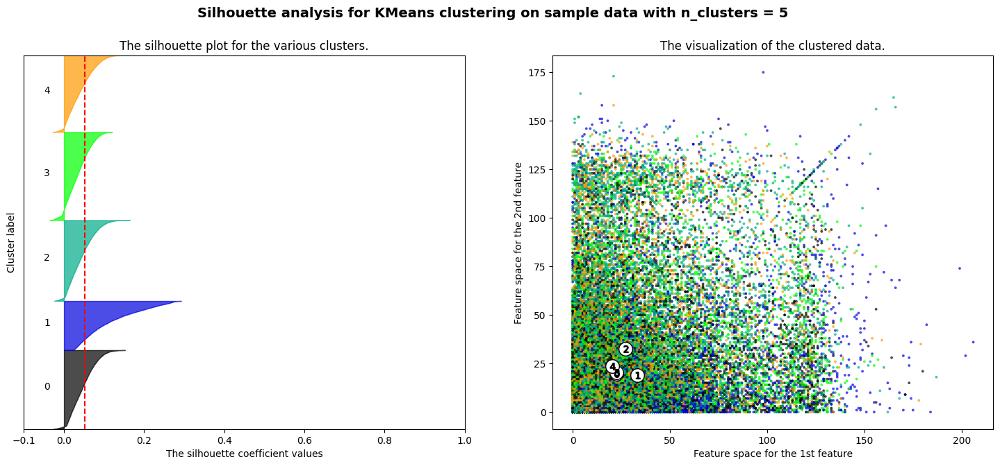

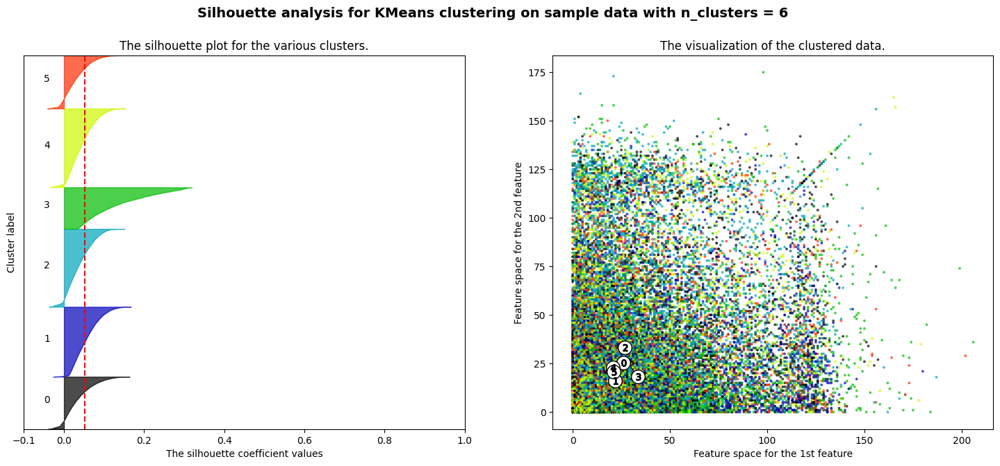

...

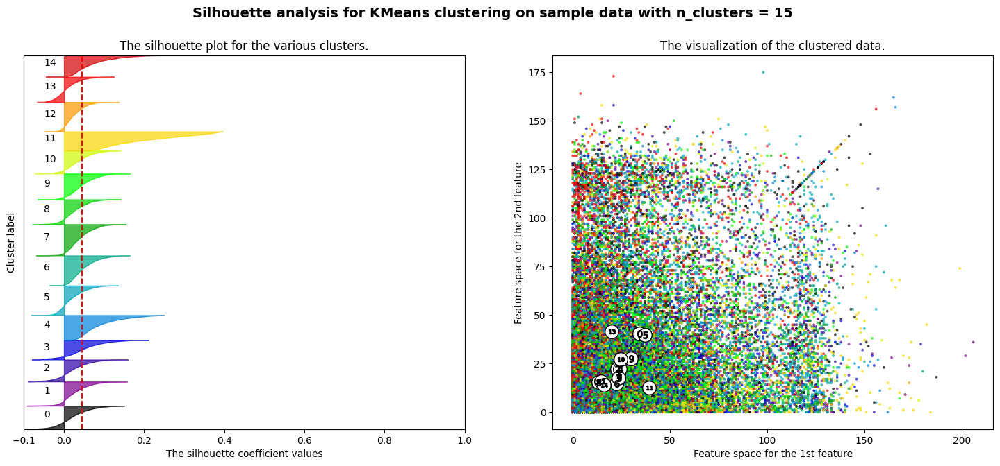

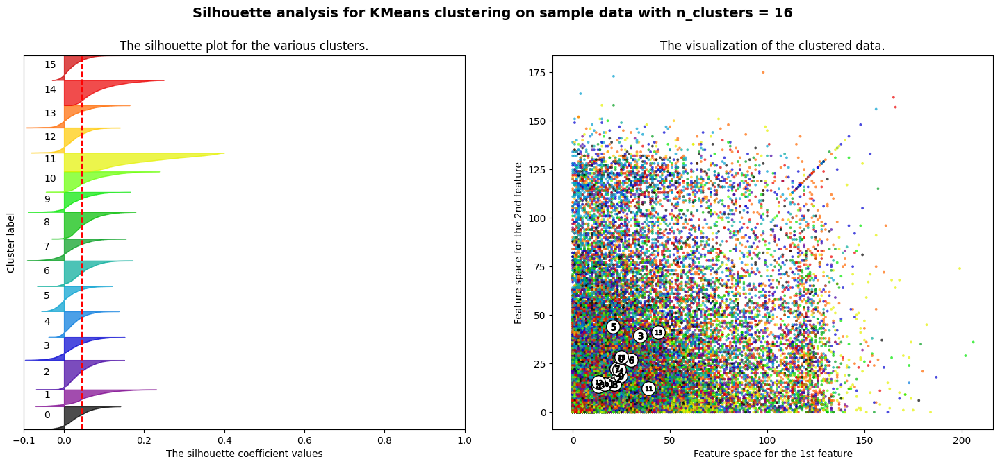

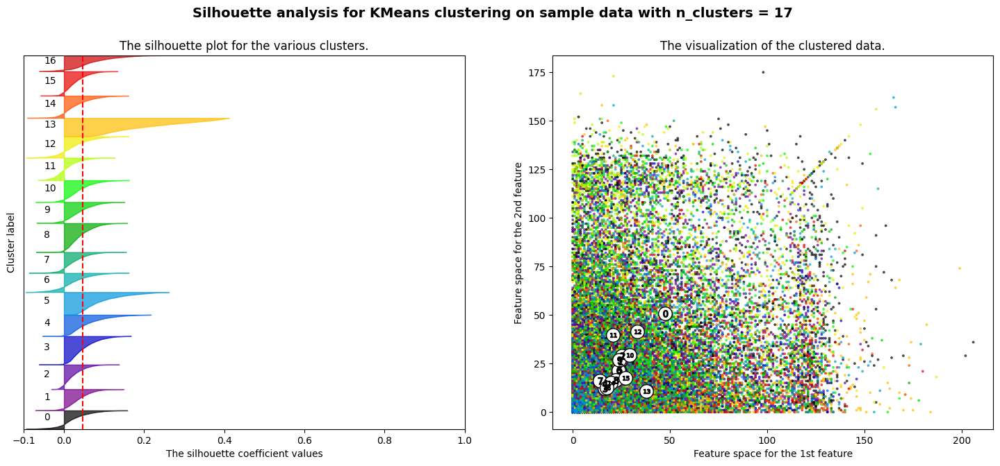

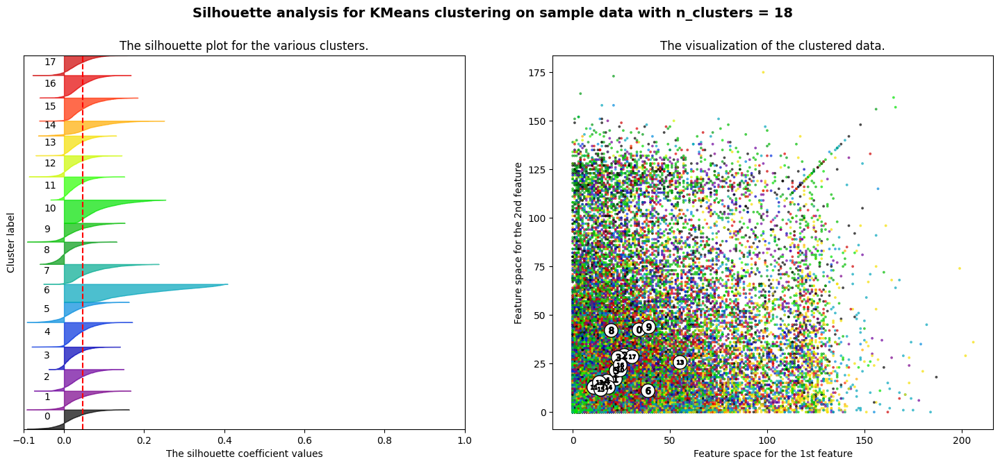

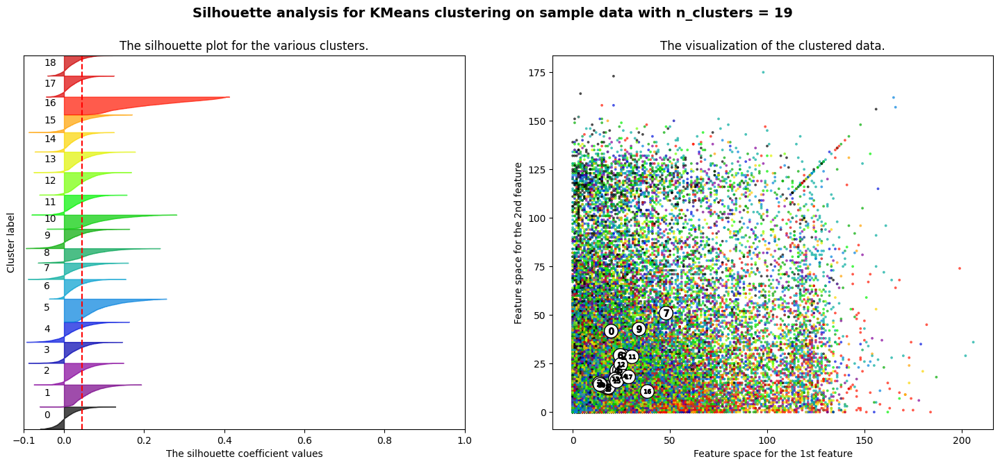

In [46]:
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

for n_clusters in K:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=random_state)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

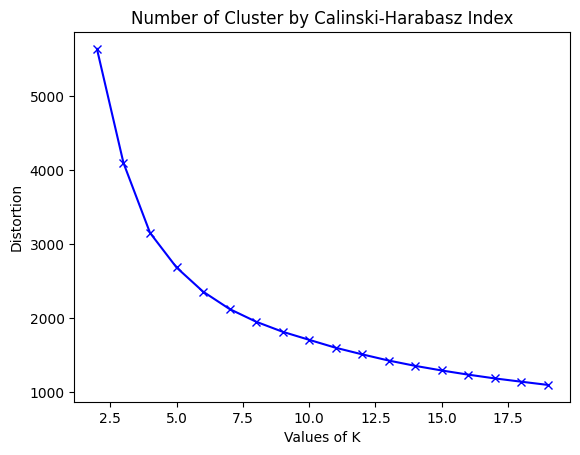

In [47]:
from sklearn import metrics

scr = []

for k in K:
    kmeans_model = KMeans(n_clusters=k, random_state = random_state).fit(X)
    labels = kmeans_model.labels_
    scr.append(metrics.calinski_harabasz_score(X, labels))

plt.plot(K, scr, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Distortion')
plt.title('Number of Cluster by Calinski-Harabasz Index')
plt.show()

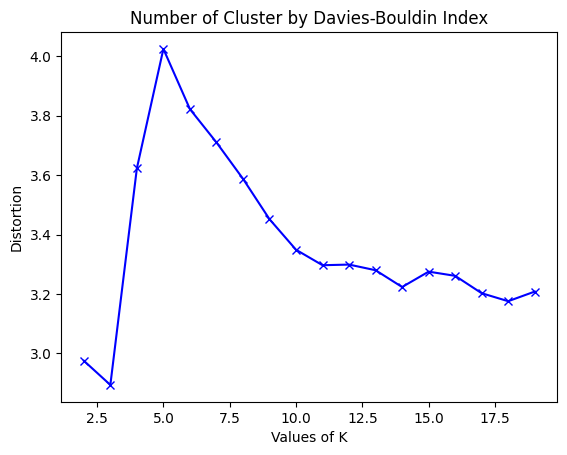

In [48]:
scr = []

for k in K:
    kmeans_model = KMeans(n_clusters=k, random_state = random_state).fit(X)
    labels = kmeans_model.labels_
    scr.append(metrics.davies_bouldin_score(X, labels))

plt.plot(K, scr, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Distortion')
plt.title('Number of Cluster by Davies-Bouldin Index')
plt.show()

In [24]:
sift_data = main_data_dir + "\\sift"
print(sift_data)

D:\Github\Stomach-Status-Classification\Data set\sift


In [25]:
sift_data_train = [i for i in glob.glob(sift_data + '\\*') if 'train' in i]
sift_data_test = [i for i in glob.glob(sift_data + '\\*') if 'test' in i]

print(sift_data_train)
print(sift_data_test)

['D:\\Github\\Stomach-Status-Classification\\Data set\\sift\\sift_train_0_3_0.04_10_1.6.json']
['D:\\Github\\Stomach-Status-Classification\\Data set\\sift\\sift_test_0_3_0.04_10_1.6.json']


In [27]:
import json 
def load_json(path):
    f = open(path)
    return  json.load(f)

sift_train_json = load_json(sift_data_train[0])
sift_test_json = load_json(sift_data_test[0])

In [67]:
k_choose = (4, 5, 6)

save_train_path = main_data_dir + "\\kmean_dataset\\" + sift_data_train[0].split("\\")[-1][:-5] + "histo{}.csv"
save_test_path = main_data_dir + "\\kmean_dataset\\" + sift_data_test[0].split("\\")[-1][:-5] + "histo{}.csv"
print(save_path.format("kmean{}".format(k_choose[0])))

D:\Github\Stomach-Status-Classification\Data set\kmean_dataset\sift_train_0_3_0.04_10_1.6kmean4.csv


In [68]:
def make_data(k_choosed, json_data, path):
    for k in k_choosed:
        save_dict = {x : [] for x in range(k+2)}
        kmeans_model = KMeans(n_clusters=k, random_state = random_state).fit(X)

        normal_dict = json_data["Group 1 - Normal"]
        abnormal_dict = json_data["Group 2 - Abnormal"]

        for img_dict in normal_dict:
            for keys in img_dict:
                img_vector_lst = img_dict[keys]
                km_vector = kmeans_model.predict(np.array(img_vector_lst))
                his_vector = np.histogram(km_vector, bins = k)[0]
                save_dict[0].append(keys)
                for i in range(1, k+1):
                    save_dict[i].append(his_vector[i-1])
                save_dict[k+1].append(0)

        for img_dict in abnormal_dict:
            for keys in img_dict:
                img_vector_lst = img_dict[keys]
                km_vector = kmeans_model.predict(np.array(img_vector_lst))
                his_vector = np.histogram(km_vector, bins = k)[0]
                save_dict[0].append(keys)
                for i in range(1, k+1):
                    save_dict[i].append(his_vector[i-1])
                save_dict[k+1].append(1)
        if path:
            df = pd.DataFrame(save_dict)
            df.to_csv(path.format(k))

make_data(k_choose, sift_train_json, save_train_path)
make_data(k_choose, sift_test_json, save_test_path)